## Data Proporcessing 

In [ ]:
#Import the correponding package
import pandas as pd
import wgan
import torch
import pandas as pd

In [3]:
df_rhc = pd.read_csv('C://Users//fehim//Downloads//rhc.csv')

In [5]:
#Turns into to dummy variables
df_rhc['card'] = df_rhc['card'].map({'Yes': 1, 'No': 0})
df_rhc['resp'] = df_rhc['resp'].map({'Yes': 1, 'No': 0})
df_rhc['neuro'] = df_rhc['neuro'].map({'Yes': 1, 'No': 0})
df_rhc['gastr'] = df_rhc['gastr'].map({'Yes': 1, 'No': 0})
df_rhc['renal'] = df_rhc['renal'].map({'Yes': 1, 'No': 0})
df_rhc['meta'] = df_rhc['meta'].map({'Yes': 1, 'No': 0})
df_rhc['hema'] = df_rhc['hema'].map({'Yes': 1, 'No': 0})
df_rhc['seps'] = df_rhc['seps'].map({'Yes': 1, 'No': 0})
df_rhc['trauma'] = df_rhc['trauma'].map({'Yes': 1, 'No': 0})
df_rhc['ortho'] = df_rhc['ortho'].map({'Yes': 1, 'No': 0})
df_rhc['dnr1'] = df_rhc['dnr1'].map({'Yes': 1, 'No': 0})
df_rhc['dth30'] = df_rhc['dth30'].map({'Yes': 1, 'No': 0})



#Turns into several columns
one_hot_encoded_data = pd.get_dummies(df_rhc, columns=['sex'], dtype= int)
one_hot_encoded_data = pd.get_dummies(one_hot_encoded_data, columns=['race'], dtype= int)
one_hot_encoded_data = pd.get_dummies(one_hot_encoded_data, columns=['income'], dtype= int)
one_hot_encoded_data = pd.get_dummies(one_hot_encoded_data, columns=['ninsclas'], dtype= int)
one_hot_encoded_data = pd.get_dummies(one_hot_encoded_data, columns=['cat1'], dtype= int)
one_hot_encoded_data = pd.get_dummies(one_hot_encoded_data, columns=['cat2'], dtype= int)
one_hot_encoded_data = pd.get_dummies(one_hot_encoded_data, columns=['ca'], dtype= int)
one_hot_encoded_data['wt0'] = 0
for i in range(0,len(one_hot_encoded_data)):
    if one_hot_encoded_data['wtkilo1'][i] > 0:
        one_hot_encoded_data['wt0'][i] = 0
    else:
        one_hot_encoded_data['wt0'][i] = 1
one_hot_encoded_data["rhc"] = 0
for i in range(0,len(one_hot_encoded_data)):
    if one_hot_encoded_data["swang1"][i] == "RHC":
        one_hot_encoded_data['rhc'][i] = 1
    else:
        one_hot_encoded_data['rhc'][i] = 0


C:\Users\fehim\AppData\Local\Temp\ipykernel_2292\1253716871.py:63: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  one_hot_encoded_data['wt0'][i] = 0
C:\Users\fehim\AppData\Local\Temp\ipykernel_2292\1253716871.py:63: SettingWithCopyWarning: 
A

In [6]:
processed_df = one_hot_encoded_data[['dth30',"rhc","age","sex_Female","race_black","race_other","edu",
"income_$11-$25k","income_$25-$50k","income_> $50k","ninsclas_Medicaid","ninsclas_Medicare","ninsclas_Medicare & Medicaid","ninsclas_No insurance",
"ninsclas_Private & Medicare","cat1_COPD","cat1_MOSF w/Sepsis","cat1_MOSF w/Malignancy","cat1_CHF" ,"cat1_Coma","cat1_Cirrhosis",
"cat1_Lung Cancer", "cat1_Colon Cancer","cat2_MOSF w/Sepsis",  "cat2_Coma","cat2_MOSF w/Malignancy", "cat2_Lung Cancer","cat2_Colon Cancer", 
"cat2_Cirrhosis","resp","card","neuro","gastr","renal","meta","hema","seps","trauma","ortho","das2d3pc","dnr1","ca_Yes","ca_No",
"surv2md1","aps1","scoma1","wtkilo1","temp1","meanbp1","resp1","hrt1","pafi1","paco21","ph1","wblc1","hema1","sod1","pot1","crea1","bili1","alb1",
"cardiohx","chfhx","dementhx","psychhx","chrpulhx","renalhx","liverhx","gibledhx","malighx","immunhx","transhx","amihx","wt0"]]

## Neural Networks Training

In [8]:
df = processed_df
batch_size=128
architecture = [128, 128, 128]
lr=1e-4
max_epochs=5000
optimizer=torch.optim.Adam
print("starting training")
critic_arch = architecture.copy()
critic_arch.reverse()
continuous_vars1 = ["age","edu","surv2md1","aps1","scoma1","wtkilo1","temp1","meanbp1","hrt1",
                    "pafi1","paco21","ph1","wblc1","hema1","sod1","pot1","crea1","bili1","alb1","das2d3pc"]
categorical_vars1 = ["sex_Female","race_black","race_other","income_$11-$25k","income_$25-$50k","income_> $50k","ninsclas_Medicaid",
                      "ninsclas_Medicare","ninsclas_Medicare & Medicaid","ninsclas_No insurance","ninsclas_Private & Medicare","cat1_COPD",
                      "cat1_MOSF w/Sepsis","cat1_MOSF w/Malignancy","cat1_CHF" ,"cat1_Coma","cat1_Cirrhosis","cat1_Lung Cancer", 
                      "cat1_Colon Cancer","cat2_MOSF w/Sepsis","cat2_Coma","cat2_MOSF w/Malignancy", "cat2_Lung Cancer","cat2_Colon Cancer", 
                      "cat2_Cirrhosis","resp","card","neuro","gastr","renal","meta","hema","seps","trauma","ortho","dnr1",
                      "ca_Yes","ca_No","cardiohx","chfhx","dementhx","psychhx","chrpulhx","renalhx","liverhx","gibledhx","malighx",
                      "immunhx","transhx","amihx","wt0"]
context_vars1 = ["rhc"]

continuous_vars2 = ['dth30']
context_vars2 = ["rhc","age","edu","surv2md1","aps1","scoma1","wtkilo1","temp1","meanbp1","hrt1",
                    "pafi1","paco21","ph1","wblc1","hema1","sod1","pot1","crea1","bili1","alb1","das2d3pc",
                    "sex_Female","race_black","race_other","income_$11-$25k","income_$25-$50k","income_> $50k","ninsclas_Medicaid",
                      "ninsclas_Medicare","ninsclas_Medicare & Medicaid","ninsclas_No insurance","ninsclas_Private & Medicare","cat1_COPD",
                      "cat1_MOSF w/Sepsis","cat1_MOSF w/Malignancy","cat1_CHF" ,"cat1_Coma","cat1_Cirrhosis","cat1_Lung Cancer", 
                      "cat1_Colon Cancer","cat2_MOSF w/Sepsis","cat2_Coma","cat2_MOSF w/Malignancy", "cat2_Lung Cancer","cat2_Colon Cancer", 
                      "cat2_Cirrhosis","resp","card","neuro","gastr","renal","meta","hema","seps","trauma","ortho","dnr1",
                      "ca_Yes","ca_No","cardiohx","chfhx","dementhx","psychhx","chrpulhx","renalhx","liverhx","gibledhx","malighx",
                      "immunhx","transhx","amihx","wt0"]

data_wrapper1 = wgan.DataWrapper(df, continuous_vars1, categorical_vars1,
                                  context_vars1)
x1, context1 = data_wrapper1.preprocess(df)
specifications1 = wgan.Specifications(data_wrapper1, critic_d_hidden=critic_arch, generator_d_hidden=architecture,
                                          batch_size=batch_size, optimizer=optimizer, max_epochs=max_epochs, generator_lr=lr, critic_lr=lr, print_every=1e4)

generator1 = wgan.Generator(specifications1)
critic1 = wgan.Critic(specifications1)
data_wrapper2 = wgan.DataWrapper(df, continuous_vars = continuous_vars2,
                                  context_vars= context_vars2)
x2, context2 = data_wrapper2.preprocess(df)
specifications2 = wgan.Specifications(data_wrapper2, critic_d_hidden=critic_arch, generator_lr=lr, critic_lr=lr,
                                      generator_d_hidden=architecture, optimizer=optimizer, batch_size=batch_size,
                                      max_epochs=max_epochs,print_every=1e4)

generator2 = wgan.Generator(specifications2)
critic2 = wgan.Critic(specifications2)
df_real = df.copy()
G=[generator1,generator2]
C=[critic1,critic2]
data_wrappers = [data_wrapper1,data_wrapper2]

wgan.train(generator1, critic1, x1, context1, specifications1)
wgan.train(generator2, critic2, x2, context2, specifications2)

n_samples = 500000
df_generate_x = data_wrappers[0].apply_generator(G[0], df.sample(n_samples, replace=True))
df_generate = data_wrappers[1].apply_generator(G[1], df_generate_x)
df_generate_x["rhc"] = 1 - df_generate_x["rhc"]
df_generate["dth30_cf"] = data_wrappers[1].apply_generator(G[1], df_generate_x)["dth30"]

starting training
settings: {'optimizer': <class 'torch.optim.adam.Adam'>, 'critic_d_hidden': [128, 128, 128], 'critic_dropout': 0, 'critic_steps': 15, 'critic_lr': 0.0001, 'critic_gp_factor': 5, 'generator_d_hidden': [128, 128, 128], 'generator_dropout': 0.1, 'generator_lr': 0.0001, 'generator_d_noise': 122, 'generator_optimizer': 'optimizer', 'max_epochs': 5000, 'batch_size': 128, 'test_set_size': 16, 'load_checkpoint': None, 'save_checkpoint': None, 'save_every': 100, 'print_every': 10000.0, 'device': 'cpu'}
settings: {'optimizer': <class 'torch.optim.adam.Adam'>, 'critic_d_hidden': [128, 128, 128], 'critic_dropout': 0, 'critic_steps': 15, 'critic_lr': 0.0001, 'critic_gp_factor': 5, 'generator_d_hidden': [128, 128, 128], 'generator_dropout': 0.1, 'generator_lr': 0.0001, 'generator_d_noise': 1, 'generator_optimizer': 'optimizer', 'max_epochs': 5000, 'batch_size': 128, 'test_set_size': 16, 'load_checkpoint': None, 'save_checkpoint': None, 'save_every': 100, 'print_every': 10000.0, 'de

In [10]:
df_generate.to_csv("D://Moses//Quantile_RDD//Result//quantile_rdd_extension.csv", index=False)

## Point Prediction

In [50]:
median_data = pd.DataFrame(processed_df.median()).transpose()
median_data = median_data.drop(columns= "dth30")
median_data
df_median = data_wrappers[1].apply_generator(G[1], median_data)
df_median["rhc"] = 1 - df_median["rhc"]
df_median["dth30_cf"] = data_wrappers[1].apply_generator(G[1], df_median)["dth30"]
df_median["rhc"] = 1 - df_median["rhc"]
df_median

,dth30,rhc,age,sex_Female,race_black,race_other,edu,income_$11-$25k,income_$25-$50k,income_> $50k,...,chrpulhx,renalhx,liverhx,gibledhx,malighx,immunhx,transhx,amihx,wt0,dth30_cf
0,-0.006662,0.0,64.047,0.0,0.0,0.0,12.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.032384


In [51]:
quantile_high = pd.DataFrame(processed_df.quantile(0.75)).transpose()
quantile_high = quantile_high.drop(columns= "dth30")
df_quantile_high = data_wrappers[1].apply_generator(G[1], quantile_high)
df_quantile_high["rhc"] = 1 - df_quantile_high["rhc"]
df_quantile_high["dth30_cf"] = data_wrappers[1].apply_generator(G[1], df_quantile_high)["dth30"]
df_quantile_high["rhc"] = 1 - df_quantile_high["rhc"]
df_quantile_high

,dth30,rhc,age,sex_Female,race_black,race_other,edu,income_$11-$25k,income_$25-$50k,income_> $50k,...,chrpulhx,renalhx,liverhx,gibledhx,malighx,immunhx,transhx,amihx,wt0,dth30_cf
0,-0.002513,1.0,73.932465,1.0,0.0,0.0,13.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.008889


In [52]:
quantile_low = pd.DataFrame(processed_df.quantile(0.25)).transpose()
quantile_low = quantile_low.drop(columns= "dth30")
df_quantile_low = data_wrappers[1].apply_generator(G[1], quantile_low)
df_quantile_low["rhc"] = 1 - df_quantile_low["rhc"]
df_quantile_low["dth30_cf"] = data_wrappers[1].apply_generator(G[1], df_quantile_low)["dth30"]
df_quantile_low["rhc"] = 1 - df_quantile_low["rhc"]
df_quantile_low

,dth30,rhc,age,sex_Female,race_black,race_other,edu,income_$11-$25k,income_$25-$50k,income_> $50k,...,chrpulhx,renalhx,liverhx,gibledhx,malighx,immunhx,transhx,amihx,wt0,dth30_cf
0,-0.007698,0.0,50.14949,0.0,0.0,0.0,10.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.009062


In [53]:
test_qunatile_extension = pd.concat([df_median, df_quantile_high, df_quantile_low], axis=0)
test_qunatile_extension

,dth30,rhc,age,sex_Female,race_black,race_other,edu,income_$11-$25k,income_$25-$50k,income_> $50k,...,chrpulhx,renalhx,liverhx,gibledhx,malighx,immunhx,transhx,amihx,wt0,dth30_cf
0,-0.006662,0.0,64.047000,0.0,0.0,0.0,12.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.032384
0,-0.002513,1.0,73.932465,1.0,0.0,0.0,13.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.008889
0,-0.007698,0.0,50.149490,0.0,0.0,0.0,10.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.009062


In [55]:
test_qunatile_extension.to_csv("D://Moses//Quantile_RDD//Result//quantile_rdd_test_extension.csv", index=False)

## Plotting the Simulation Results

In [9]:
df_generate = pd.read_csv("D://Moses//Quantile_RDD//Result//quantile_rdd_extension.csv")

In [10]:
continuous_vars1 = ["age","edu","surv2md1","aps1","scoma1","wtkilo1","temp1","meanbp1","hrt1",
                        "pafi1","paco21","ph1","wblc1","hema1","sod1","pot1","crea1","bili1","alb1","das2d3pc"]
categorical_vars1 = ["sex_Female","race_black","race_other","income_$11-$25k","income_$25-$50k","income_> $50k","ninsclas_Medicaid",
                         "ninsclas_Medicare","ninsclas_Medicare & Medicaid","ninsclas_No insurance","ninsclas_Private & Medicare","cat1_COPD",
                         "cat1_MOSF w/Sepsis","cat1_MOSF w/Malignancy","cat1_CHF" ,"cat1_Coma","cat1_Cirrhosis","cat1_Lung Cancer", 
                         "cat1_Colon Cancer","cat2_MOSF w/Sepsis","cat2_Coma","cat2_MOSF w/Malignancy", "cat2_Lung Cancer","cat2_Colon Cancer", 
                         "cat2_Cirrhosis","resp","card","neuro","gastr","renal","meta","hema","seps","trauma","ortho","dnr1",
                         "ca_Yes","ca_No","cardiohx","chfhx","dementhx","psychhx","chrpulhx","renalhx","liverhx","gibledhx","malighx",
                         "immunhx","transhx","amihx","wt0"]
context_vars1 = ["rhc"]
continuous_vars2 = ['dth30']

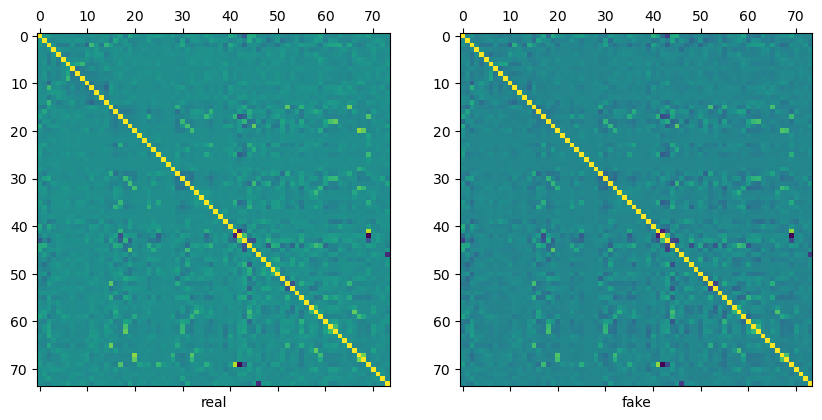

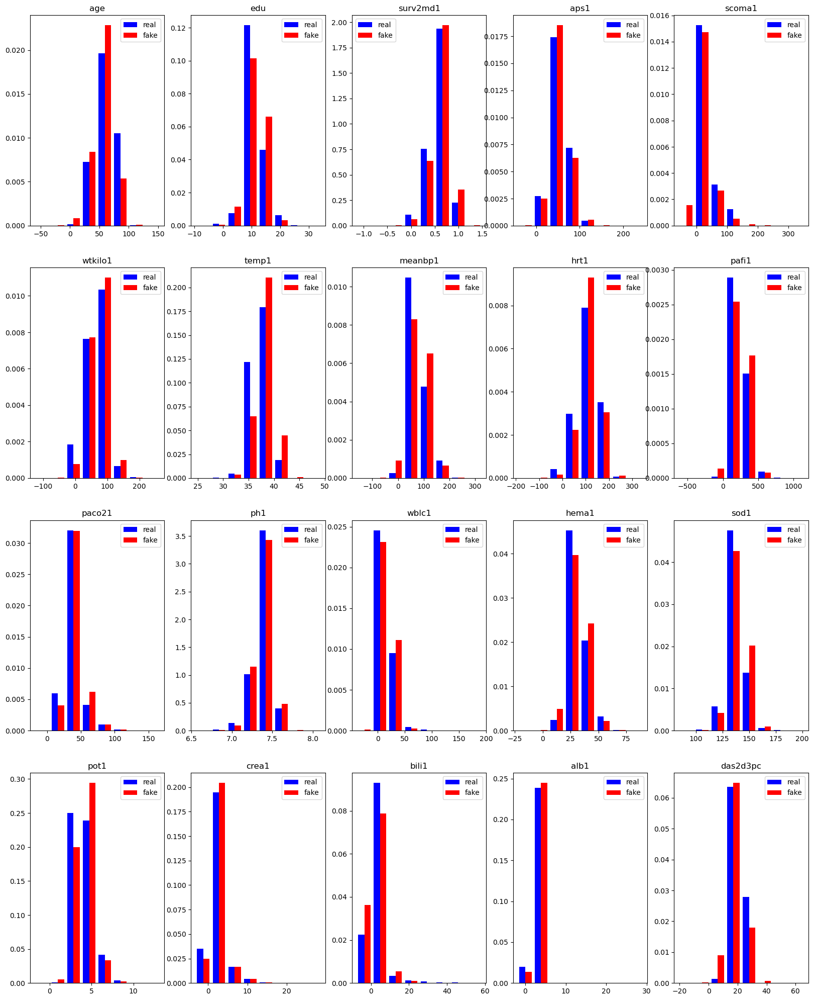

In [15]:
table_groupby = ["rhc"]
scatterplot = dict(x=[],
                        y=[],
                        samples = 400)
histogram = dict(variables = continuous_vars1,
                    nrow=4, ncol=5)
#compare_path = path + "compare_"+type
result = wgan.compare_dfs(processed_df, df_generate.iloc[:,0:-1], figsize=5, table_groupby=table_groupby,scatterplot=scatterplot,
                    histogram=histogram,save=True,
                       path="D://Moses//Quantile_RDD//Result//rhc")

In [36]:
categorical_sep1 = ["sex_Female","race_black","race_other","income_$11-$25k","income_$25-$50k","income_> $50k","ninsclas_Medicaid",
                         "ninsclas_Medicare","ninsclas_Medicare & Medicaid","ninsclas_No insurance","ninsclas_Private & Medicare","cat1_COPD",
                         "cat1_MOSF w/Sepsis","cat1_MOSF w/Malignancy","cat1_CHF" ,"cat1_Coma","cat1_Cirrhosis","cat1_Lung Cancer", 
                         "cat1_Colon Cancer","cat2_MOSF w/Sepsis","cat2_Coma","cat2_MOSF w/Malignancy", "cat2_Lung Cancer","cat2_Colon Cancer", 
                         "cat2_Cirrhosis","resp","card","neuro","gastr","renal","meta","hema","seps","trauma","ortho","dnr1",
                         "ca_Yes","ca_No","cardiohx","chfhx","dementhx","psychhx","chrpulhx","renalhx","liverhx","gibledhx","malighx",
                         "immunhx","transhx","amihx","wt0"]

In [37]:
categorical_sep1 = ["sex_Female","race_black","income_$11-$25k","income_$25-$50k","income_> $50k","ninsclas_Medicaid",
                         "ninsclas_Medicare","ninsclas_Medicare & Medicaid","ninsclas_No insurance","ninsclas_Private & Medicare","cat1_COPD",
                         "cat1_MOSF w/Sepsis","cat1_MOSF w/Malignancy","cat1_CHF","cat1_Coma","cat1_Cirrhosis","cat1_Lung Cancer", 
                         "cat1_Colon Cancer","cat2_MOSF w/Sepsis","cat2_Coma","cat2_MOSF w/Malignancy", "cat2_Lung Cancer","cat2_Colon Cancer", 
                         "cat2_Cirrhosis","resp"]
len(categorical_sep1)

25

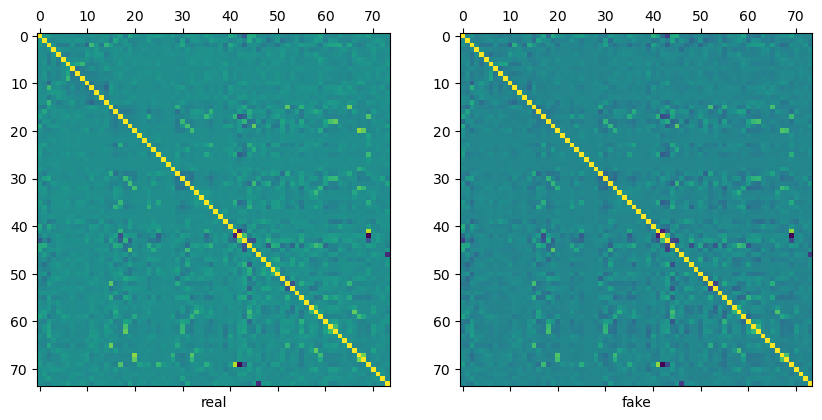

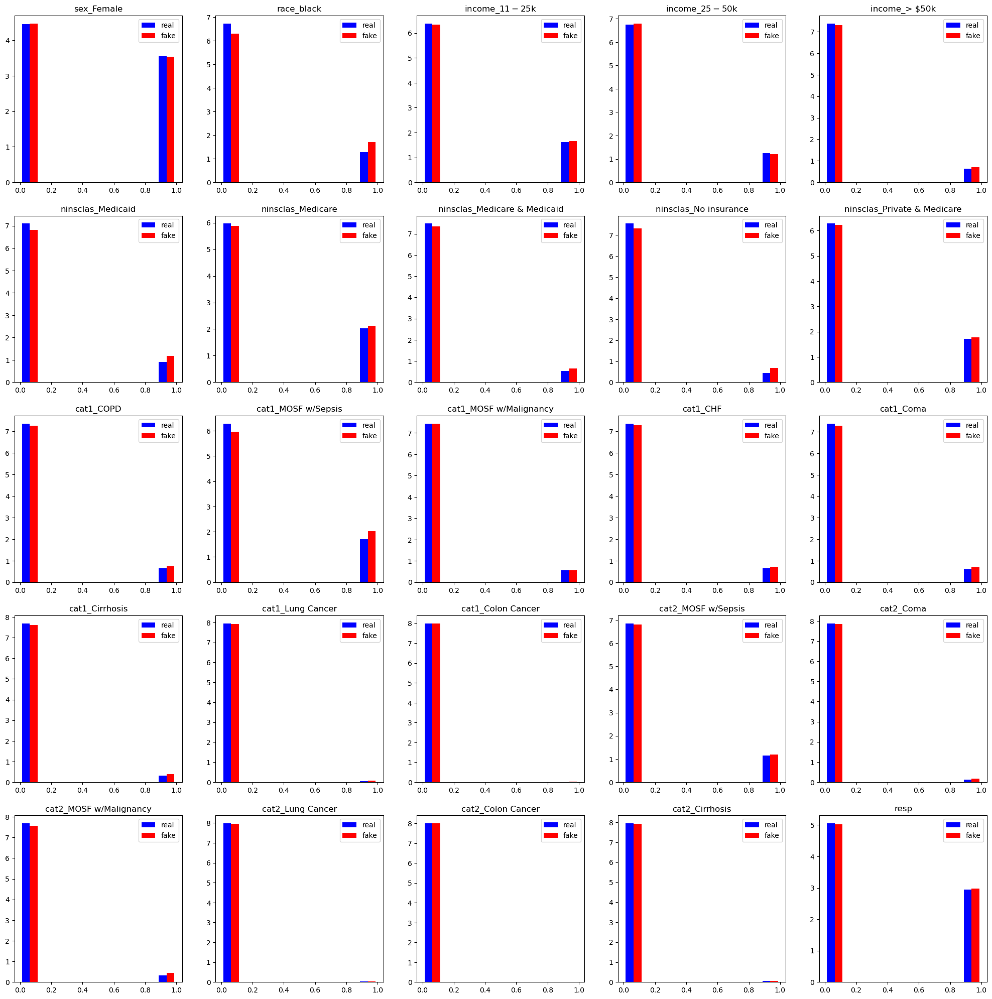

In [46]:
table_groupby = ["rhc"]
#scatterplot = dict(x=[],
                        #y=[],
                        #samples = 400)
histogram = dict(variables = categorical_sep1,
                    nrow=5, ncol=5)
#compare_path = path + "compare_"+type
result = wgan.compare_dfs(processed_df, df_generate.iloc[:,0:-1], figsize=5, table_groupby=table_groupby,
                    histogram=histogram,save=True,
                       path="D://Moses//Quantile_RDD//result_rhc_cat1")

In [43]:
categorical_sep2 = ["card","neuro","gastr","renal","meta","hema","seps","trauma","ortho","dnr1",
                         "ca_Yes","ca_No","cardiohx","chfhx","dementhx","psychhx","chrpulhx","renalhx","liverhx","gibledhx","malighx",
                         "immunhx","transhx","amihx","wt0"]

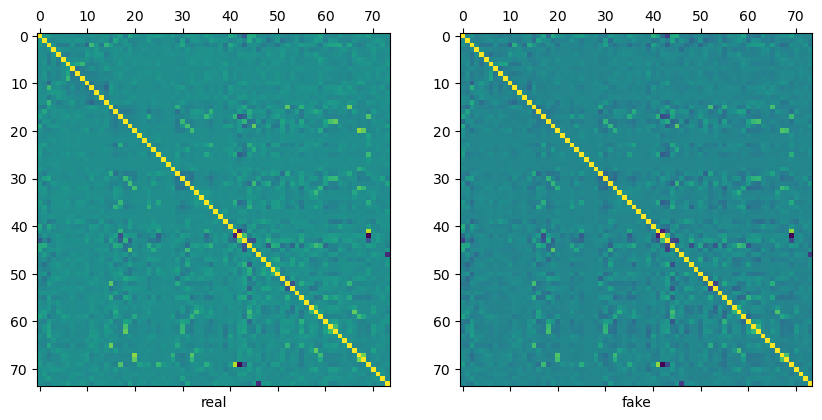

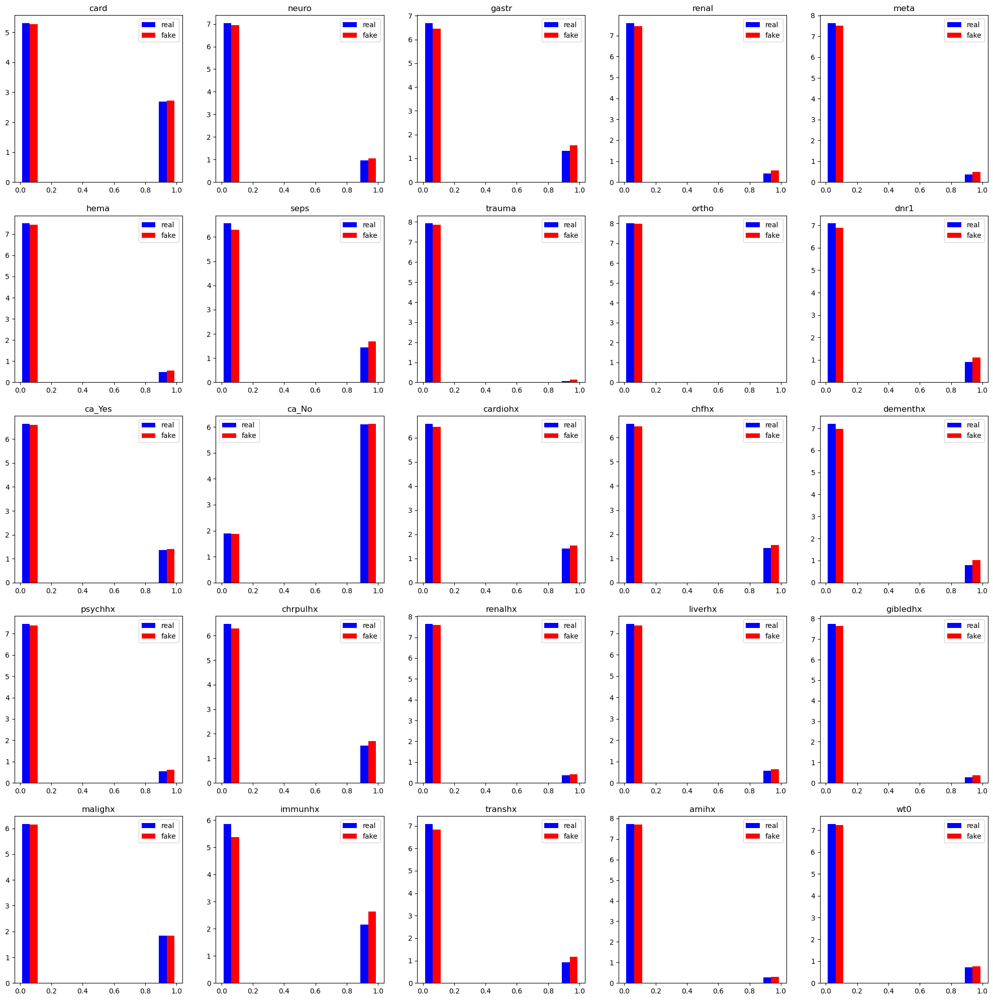

In [47]:
table_groupby = ["rhc"]
#scatterplot = dict(x=[],
                        #y=[],
                        #samples = 400)
histogram = dict(variables = categorical_sep2,
                    nrow=5, ncol=5)
#compare_path = path + "compare_"+type
result = wgan.compare_dfs(processed_df, df_generate.iloc[:,0:-1], figsize=5, table_groupby=table_groupby,
                    histogram=histogram,save=True,
                       path="D://Moses//Quantile_RDD//result_rhc_cat2")